<a href="https://colab.research.google.com/github/hajicek/ml_public/blob/main/cats_dogs_tflite_example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [8]:
'''
Here's some pretty basic sample code I put together using a well-known data set.
A lot of pieces are borrowed from examples and documentation with some clean up.

The basic premise is to create a tensorflow-lite model to identify an image as
containing a cat or a dog using a pretrained layer and some custom training.
Later we load from disk and reuse the model first on some pre-packaged test data
and then on our own image.
'''

import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_datasets as tfds
import numpy as np
import matplotlib.pylab as plt

MODULE_HANDLE = 'https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4'
PIXELS = 224
IMAGE_SIZE = (PIXELS, PIXELS)
MODEL_FILE_NAME = 'cats_dogs_model'
CLASS_NAMES = ['cat', 'dog']

# We'll use this pre-trained layer later in our model
feature_extractor = hub.KerasLayer(MODULE_HANDLE, input_shape=IMAGE_SIZE+(3,), output_shape=[1280], trainable=False)

# Resize our input images to the expected shape and normalize the pixel values
# Note we're working with RGB [224, 224, 3] images
def format_image(image, label):
	image = tf.image.resize(image, IMAGE_SIZE)/255.0
	return image, label

# Copy and pasted example code for plotting images nicely
def plot_image(i, predictions_array, true_label, img):
    predictions_array, true_label, img = predictions_array[i], true_label[i], img[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    img = np.squeeze(img)

    plt.imshow(img, cmap=plt.cm.binary)

    predicted_label = np.argmax(predictions_array)

    if predicted_label == true_label:
        color = 'green'
    else:
        color = 'red'

    plt.xlabel("{} {:2.0f}% ({})".format(CLASS_NAMES[predicted_label],
                                         100*np.max(predictions_array),
                                         CLASS_NAMES[true_label]), color=color)

# Use tensorflow datasets to download preprocessed cats vs. dogs dataset.
# Images can be downloaded directly from microsoft and parsed but free colab
# tends to hit the memory limit doing those operations.
# Dataset comes as one set of data; split it up for training, validation, and
# Test purposes.
(raw_train, raw_validation, raw_test), metadata = tfds.load(
	'cats_vs_dogs',
	split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
	with_info=True,
	as_supervised=True,
	)

num_examples = metadata.splits['train'].num_examples
num_classes = metadata.features['label'].num_classes
print("Number of examples: {}".format(num_examples))
print("Number of classes: {}".format(num_classes))

# Format the images to the required size/normalization for what we're doing
BATCH_SIZE = 32
train_batches = raw_train.shuffle(num_examples // 4).map(format_image).batch(BATCH_SIZE).prefetch(1)
validation_batches = raw_validation.map(format_image).batch(BATCH_SIZE).prefetch(1)
test_batches = raw_test.map(format_image).batch(1)





Number of examples: 23262
Number of classes: 2


In [9]:
# It's best to run this on a GPU instance
# Create the model with the pre-trained layer we borrowed
model = tf.keras.Sequential()
model.add(feature_extractor)
model.add(tf.keras.layers.Dense(num_classes,activation='softmax'))

model.compile(optimizer='adam',
	loss='sparse_categorical_crossentropy',
	metrics=['accuracy'])

hist = model.fit(train_batches, epochs = 5, validation_data=validation_batches)

# Save the model so we can convert it to a tflite model next
tf.saved_model.save(model, MODEL_FILE_NAME)

Epoch 1/5
582/582 [==============================] - 50s 68ms/step - loss: 0.0539 - accuracy: 0.9818 - val_loss: 0.0409 - val_accuracy: 0.9867
Epoch 2/5
582/582 [==============================] - 51s 73ms/step - loss: 0.0305 - accuracy: 0.9895 - val_loss: 0.0432 - val_accuracy: 0.9875
Epoch 3/5
582/582 [==============================] - 40s 55ms/step - loss: 0.0250 - accuracy: 0.9915 - val_loss: 0.0534 - val_accuracy: 0.9819
Epoch 4/5
582/582 [==============================] - 38s 54ms/step - loss: 0.0223 - accuracy: 0.9924 - val_loss: 0.0398 - val_accuracy: 0.9893
Epoch 5/5
582/582 [==============================] - 40s 58ms/step - loss: 0.0183 - accuracy: 0.9941 - val_loss: 0.0413 - val_accuracy: 0.9871


In [5]:
# Load the model we created in the last cell and then convert it to a
# Tensorflow Light model optimized for size and speed (~2.7MB)
converter = tf.lite.TFLiteConverter.from_saved_model(MODEL_FILE_NAME)
converter.optimizations = [tf.lite.Optimize.DEFAULT]

def representative_data_gen():
    for input_value, _ in test_batches.take(100):
        yield [input_value]

converter.representative_dataset = representative_data_gen
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]

tflite_model = converter.convert()
tflite_model_file = MODEL_FILE_NAME + '.tflite'

with open(tflite_model_file, "wb") as f:
    f.write(tflite_model)

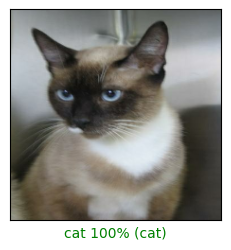

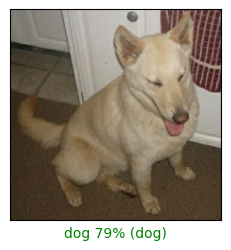

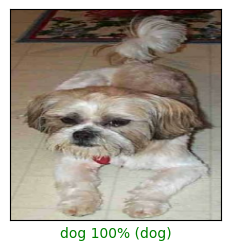

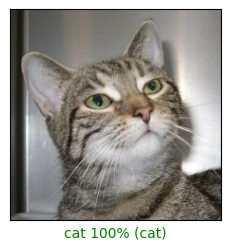

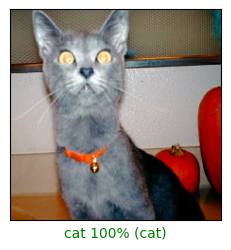

...

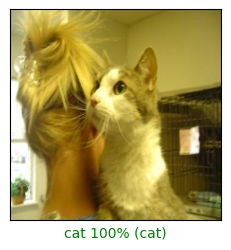

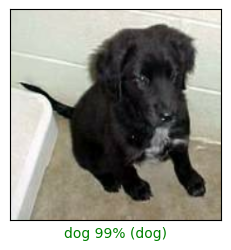

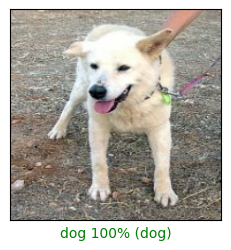

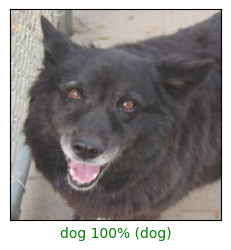

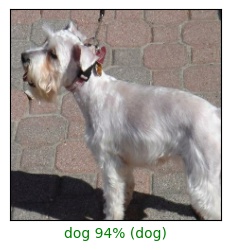

Out of 100 predictions I got 98 correct


In [11]:
# Load the tflite model from the last cell and run the test data through it.
tflite_model_file = MODEL_FILE_NAME + '.tflite'
interpreter = tf.lite.Interpreter(model_path=tflite_model_file)
interpreter.allocate_tensors()

input_index = interpreter.get_input_details()[0]["index"]
output_index = interpreter.get_output_details()[0]["index"]

predictions = []

test_labels, test_imgs = [], []
for img, label in test_batches.take(100):
    interpreter.set_tensor(input_index, img)
    interpreter.invoke()

    predictions.append(interpreter.get_tensor(output_index))
    test_labels.append(label.numpy()[0])
    test_imgs.append(img)

score = 0
for item in range(0,99):
    prediction = np.argmax(predictions[item])
    label = test_labels[item]
    if prediction == label:
        score=score+1

for index in range(0,99):
    plt.figure(figsize=(6,3))
    plt.subplot(1,2,1)
    plot_image(index, predictions, test_labels, test_imgs)
    plt.show()

print("Out of 100 predictions I got " + str(score) + " correct")

--2024-04-11 05:52:19--  https://lh3.googleusercontent.com/drive-viewer/AKGpihYFZNTn9M6HCmpgO-bNwymWOj7VmW4Rd6zygfSs-4uWcYzt0hSJgf1M-13OfrHrIwH-dfIQV79KVN4fUjvMefLJlmVXTUEFjA=s1600-v0
Resolving lh3.googleusercontent.com (lh3.googleusercontent.com)... 142.251.2.132, 2607:f8b0:4023:c0d::84
Connecting to lh3.googleusercontent.com (lh3.googleusercontent.com)|142.251.2.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1155015 (1.1M) [image/jpeg]
Saving to: ‘/content/enzo.jpg’

/content/enzo.jpg   100%[===================>]   1.10M  7.12MB/s    in 0.2s    

2024-04-11 05:52:19 (7.12 MB/s) - ‘/content/enzo.jpg’ saved [1155015/1155015]



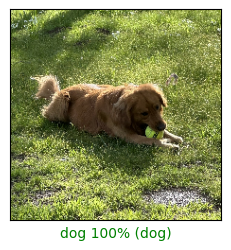

100% Good Boy


In [20]:
!wget -O /content/enzo.jpg "https://lh3.googleusercontent.com/drive-viewer/AKGpihYFZNTn9M6HCmpgO-bNwymWOj7VmW4Rd6zygfSs-4uWcYzt0hSJgf1M-13OfrHrIwH-dfIQV79KVN4fUjvMefLJlmVXTUEFjA=s1600-v0"

# Convert our jpeg to something tensorflow can use
raw_image = tf.io.decode_jpeg(tf.io.read_file('/content/enzo.jpg'), channels=3)
img, label = format_image(raw_image, 1)
img = img[np.newaxis, ...] # add fourth dimension to start of array for set_tensor

# Load our saved model
tflite_model_file = MODEL_FILE_NAME + '.tflite'
interpreter = tf.lite.Interpreter(model_path=tflite_model_file)
interpreter.allocate_tensors()

input_index = interpreter.get_input_details()[0]["index"]
output_index = interpreter.get_output_details()[0]["index"]

# Even though we're just using a single image, match output to the cell above
# for easier code reuse
predictions = []
test_labels, test_imgs = [], []

# Drum roll
interpreter.set_tensor(input_index, img)
interpreter.invoke()

predictions.append(interpreter.get_tensor(output_index))
test_labels.append(label)
test_imgs.append(img)

# Plot the results
for index in range(0,1):
    plt.figure(figsize=(6,3))
    plt.subplot(1,2,1)
    plot_image(index, predictions, test_labels, test_imgs)
    plt.show()

print("100% Good Boy")